# Time series analysis

In [1]:
using Dates
using DataFrames: DataFrame, nrow
using SparseArrays
using StatsBase: mean, std
using JLD2: @load

using Graphs: SimpleGraph, connected_components, neighbors
using SimpleWeightedGraphs
using CommunityDetection

using Plots
using GraphPlot: gplot, spring_layout
using Compose
using Cairo

include("../src/Simulation.jl")
using Main.Simulation: Param, Model, Strategy, C, D, WEAK_THRESHOLD, MEDIUM_THRESHOLD, STRONG_THRESHOLD, POPULATION, PAYOFF, STRATEGY_MUTATION, RELATIONSHIP_MUTATION

include("../src/Network.jl")
using Main.Network: nv, degree, convert_2nd_order

In [2]:
# 177.119629 seconds
println(Dates.format(now(), "Y-m-d H:M:S"))

@time @load "result_stable_vec.jld2" result_vec
result_stable_vec = result_vec
@time @load "result_population_vec.jld2" result_vec
result_population_vec = result_vec
@time @load "result_payoff_vec.jld2" result_vec
result_payoff_vec = result_vec
# @time @load "result_strategy_vec.jld2" result_vec
# result_strategy_vec = result_vec
# @time @load "result_relationship_vec.jld2" result_vec
# result_relationship_vec = result_vec

# result_vec_vec = [result_stable_vec, result_population_vec, result_payoff_vec, result_strategy_vec, result_relationship_vec];
result_vec_vec = [result_stable_vec, result_population_vec, result_payoff_vec];

println(Dates.format(now(), "Y-m-d H:M:S"))

2024-1-29 19:0:42
 44.108379 seconds (4.28 M allocations: 112.221 GiB, 14.59% gc time, 4.06% compilation time: 10% of which was recompilation)
 52.799125 seconds (1.74 M allocations: 121.461 GiB, 15.82% gc time, 0.03% compilation time: 82% of which was recompilation)
 49.634746 seconds (1.74 M allocations: 112.056 GiB, 18.21% gc time, 0.01% compilation time)
2024-1-29 19:3:9


In [3]:
# 0.011038 seconds (3.025 MiB)
# 0.010755 seconds
@time @load "wcc_matrix.jld2" wcc_matrix;

  0.028682 seconds (10.82 k allocations: 2.111 MiB, 94.50% compilation time)


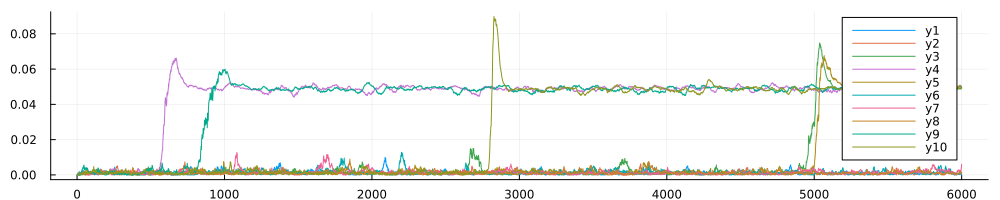

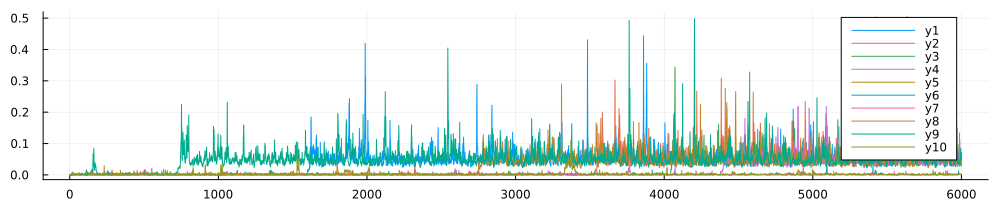

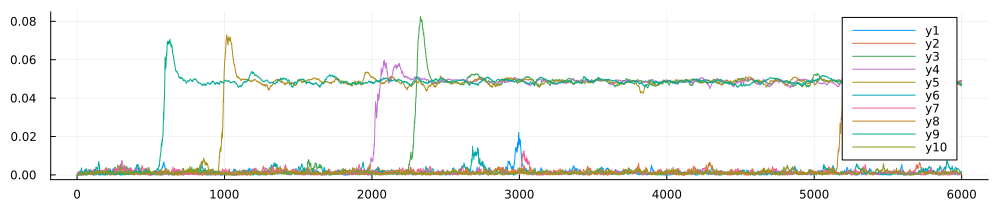

In [31]:
timesteps = 6000
num_results = length(result_vec_vec)
num_trials = length(first(result_vec_vec))
num_timesteps = length(timesteps)

for variability_mode in 1:num_results
    p = plot(size = (1000, 200))
    for trial in 1:num_trials
        strategies_vec, weights_vec = result_vec_vec[variability_mode][trial]
        mean_C_degrees = calc_mean_C_degrees(weights_vec, strategies_vec, timesteps)
        plot!(mean_C_degrees)
    end
    display(p)
end

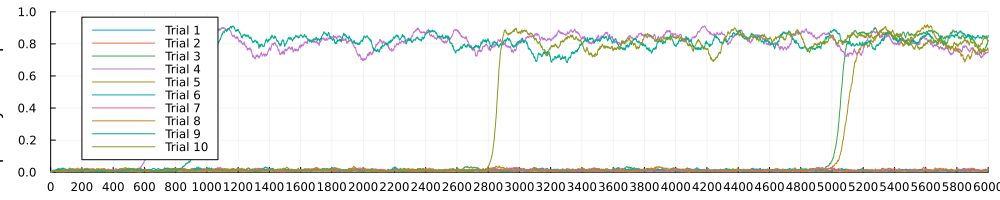

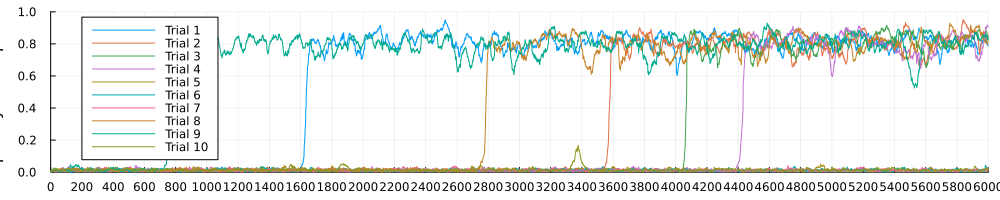

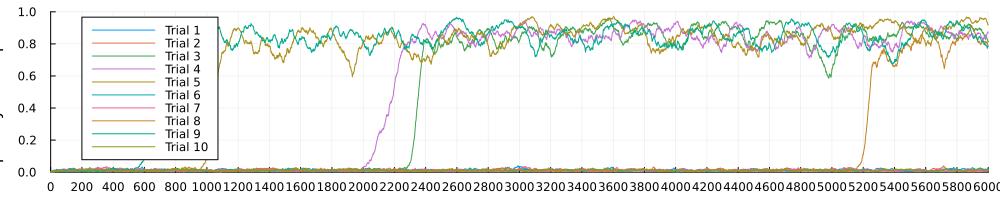

In [20]:
timesteps = 6000

for result_vec in result_vec_vec
    p = plot(xlim = (0, timesteps), ylim = (0, 1), xl = "Time step", yl = "Frequency of Cooperator", xticks = 0:(timesteps / 30):timesteps, size = (1000, 200))

    for (trial, (strategy_vec_vec, weights_vec)) in enumerate(result_vec)
        plot!([sum(strategy_vec .== C) / length(strategy_vec) for strategy_vec in strategy_vec_vec], label = "Trial $(trial)")
    end

    display(p)
end

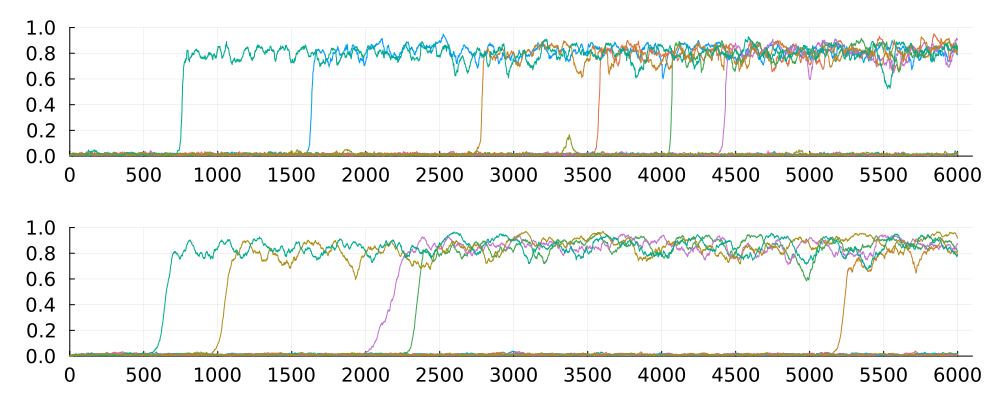

In [25]:
xticks = 0:500:6000
xlim = (0, 6100)
ylim = (0, 1)
tick_font_size = 13

result_vec = result_vec_vec[2]
p_POPULATION = plot(xlim = xlim, ylim = ylim, xl = "", yl = "", xticks = xticks, xtickfontsize = tick_font_size, ytickfontsize = tick_font_size)
for (strategy_vec_vec, _) in result_vec
    plot!([sum(strategy_vec .== C) / length(strategy_vec) for strategy_vec in strategy_vec_vec], label = false)
end

result_vec = result_vec_vec[3]
p_PAYOFF = plot(xlim = xlim, ylim = ylim, xl = "", yl = "", xticks = xticks, xtickfontsize = tick_font_size, ytickfontsize = tick_font_size)
for (strategy_vec_vec, _) in result_vec
    plot!([sum(strategy_vec .== C) / length(strategy_vec) for strategy_vec in strategy_vec_vec], label = false)
end

# result_vec = result_vec_vec[4]
# p_STRATEGY_MUTATION = plot(xlim = xlim, ylim = ylim, xl = "", yl = "", xticks = xticks, xtickfontsize = tick_font_size, ytickfontsize = tick_font_size)
# for (strategy_vec_vec, _) in result_vec
#     plot!([sum(strategy_vec .== C) / length(strategy_vec) for strategy_vec in strategy_vec_vec], label = false)
# end

# result_vec = result_vec_vec[5]
# p_RELATIONSHIP_MUTATION = plot(xlim = xlim, ylim = ylim, xl = "", yl = "", xticks = xticks, xtickfontsize = tick_font_size, ytickfontsize = tick_font_size)
# for (strategy_vec_vec, _) in result_vec
#     plot!([sum(strategy_vec .== C) / length(strategy_vec) for strategy_vec in strategy_vec_vec], label = false)
# end

# p = plot(p_POPULATION, p_PAYOFF, p_STRATEGY_MUTATION, p_RELATIONSHIP_MUTATION, layout = (4, 1), size = (1000, 900), margin = 5mm)
p = plot(p_POPULATION, p_PAYOFF, layout = (2, 1), size = (1000, 400), margin = 5mm)
savefig(p, "../img/NC/fig_lines.png")
p

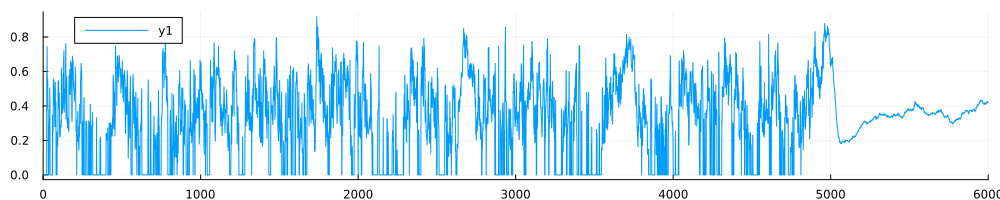

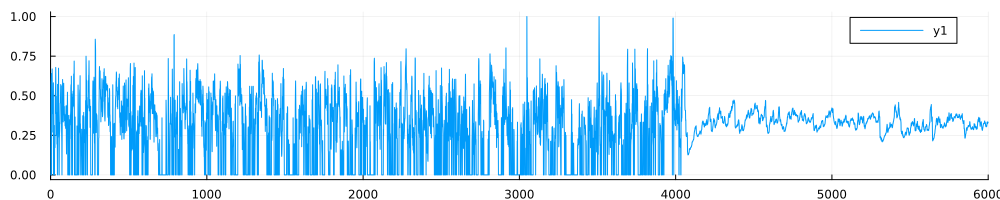

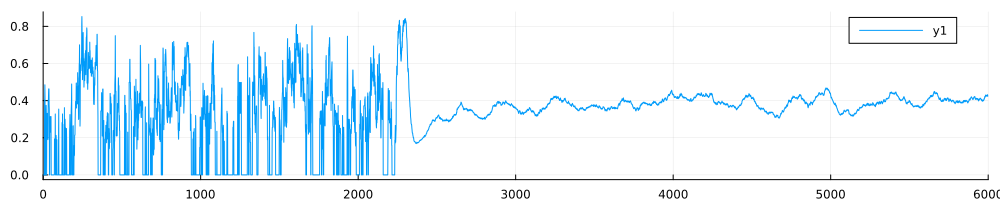

In [28]:
timesteps = 1:6000
num_results = length(result_vec_vec)
num_trials = length(first(result_vec_vec))
num_timesteps = length(timesteps)

for variability_mode in 1:num_results
    p = plot(xlim = (0, length(timesteps)), size = (1000, 200))
    for trial in 3:3
        plot!(wcc_matrix[variability_mode, trial, :])
    end
    display(p)
end

In [9]:
stable_result_vec, population_result_vec, payoff_result_vec, strategy_result_vec, relationship_result_vec = result_vec_vec
output_df, strategy_vec_vec, weights_vec = population_result_vec[1];

LoadError: BoundsError: attempt to access 3-element Vector{Vector{Tuple{Vector{Vector{Strategy}}, Vector{Matrix{Float16}}}}} at index [4]

In [10]:
function recognize_components(weights::Matrix{Float16})::Tuple{SimpleGraph, SimpleGraph, SimpleGraph}
    g25 = SimpleGraph(weights .>= WEAK_THRESHOLD)
    g50 = SimpleGraph(weights .>= MEDIUM_THRESHOLD)
    g75 = SimpleGraph(weights .>= STRONG_THRESHOLD)

    g25_components = [length(c) for c in connected_components(g25)]
    g50_components = [length(c) for c in connected_components(g50)]
    g75_components = [length(c) for c in connected_components(g75)]

    println("弱い繋がりグループ: $(length(g25_components)) 個 $(sort(g25_components, rev=true)[1])")
    println("中程度の繋がりグループ: $(length(g50_components))個 $(sort(g50_components, rev=true)[1])")
    println("強い繋がりグループ: $(length(g75_components))個 $(sort(g75_components, rev=true)[1])")

    return g25, g50, g75
end

function network_diagram(g25::SimpleGraph, g50::SimpleGraph, g75::SimpleGraph, color_val_vec::Vector)::Context
    return hstack(
        gplot(g25, nodefillc=color_val_vec, edgestrokec = colorant"gray", spring_layout(g25, C = 4.0)...),
        gplot(g50, nodefillc=color_val_vec, edgestrokec = colorant"gray", spring_layout(g50, C = 4.0)...),
        gplot(g75, nodefillc=color_val_vec, edgestrokec = colorant"gray", spring_layout(g75, C = 4.0)...)
    )
end

i = 3857

println("第$(i)世代")
println("協力率: $(mean(strategy_vec_vec[i] .== C))")

color_val_vec = [s == C ? colorant"blue" : colorant"red" for s in strategy_vec_vec[i]]

g25, g50, g75 = recognize_components(weights_vec[i])
p1 = network_diagram(g25, g50, g75, color_val_vec)

weights2 = convert_2nd_order(weights_vec[i])
g25, g50, g75 = recognize_components(weights2)
p2 = network_diagram(g25, g50, g75, color_val_vec)

set_default_graphic_size(24cm, 8cm)
draw(PNG(400, 260), vstack(p1, p2))

i = 3875

println("第$(i)世代")
println("協力率: $(mean(strategy_vec_vec[i] .== C))")

color_val_vec = [s == C ? colorant"blue" : colorant"red" for s in strategy_vec_vec[i]]

g25, g50, g75 = recognize_components(weights_vec[i])
p1 = network_diagram(g25, g50, g75, color_val_vec)

weights2 = convert_2nd_order(weights_vec[i])
g25, g50, g75 = recognize_components(weights2)
p2 = network_diagram(g25, g50, g75, color_val_vec)

set_default_graphic_size(24cm, 8cm)
draw(PNG(400, 260), vstack(p1, p2))

第3857世代


LoadError: UndefVarError: `strategy_vec_vec` not defined

In [11]:
function get_color(cooperation_rate::Float64)::RGB
    if cooperation_rate < 0.1
        return RGB(0xB3/255, 0x20/255, 0x34/255) #B32034
    elseif cooperation_rate < 0.2
        return RGB(0xBF/255, 0x49/255, 0x59/255) #BF4959
    elseif cooperation_rate < 0.3
        return RGB(0xC5/255, 0x60/255, 0x6D/255) #C5606D
    elseif cooperation_rate < 0.4
        return RGB(0xD1/255, 0x91/255, 0x9A/255) #D1919A
    elseif cooperation_rate < 0.5
        return RGB(0xDD/255, 0xC6/255, 0xC9/255) #DDC6C9
    elseif cooperation_rate < 0.6
        return RGB(0x2D/255, 0x57/255, 0x9A/255) #2D579A
    elseif cooperation_rate < 0.7
        return RGB(0x50/255, 0x74/255, 0xAC/255) #5074AC
    elseif cooperation_rate < 0.8
        return RGB(0x65/255, 0x84/255, 0xB5/255) #6584B5
    elseif cooperation_rate < 0.9
        return RGB(0x92/255, 0xA7/255, 0xC8/255) #92A7C8
    else
        return RGB(0xC6/255, 0xCF/255, 0xDA/255) #C6CFDA
    end
end;

In [12]:
for timestep in 3830:3:3880
    N = nv(weights_vec[timestep])
    g = SimpleWeightedGraph(weights_vec[timestep])
    strategy_vec = strategy_vec_vec[timestep]

    # コミュニティ検出 (Spectral Clustering: Bethe Hessian matrix)
    communities = community_detection_bethe(g, kmax = 30)

    # コミュニティ毎にノードを分類
    community_count = maximum(communities)
    community_vec = [[] for _ in 1:community_count]
    for (i, community) in enumerate(communities)
        push!(community_vec[community], i)
    end
    community_vec = sort(community_vec, by = x -> length(x), rev = true)

    cooperation_rate_vec = [mean(strategy_vec[community] .== C) for community in community_vec]

    if maximum(cooperation_rate_vec) > 0.01
        println("timestep: $(timestep)")
        println("Cooperation rate: $(round(mean(strategy_vec .== C), digits = 2))")
        # グラフのノードのサイズと色を設定
        node_sizes = [length(community) * 10 for community in community_vec]  # コミュニティのサイズに応じて調整
        node_colors = [get_color(cooperation_rate) for cooperation_rate in cooperation_rate_vec]  # 協力者の比率に応じて色を設定

        # コミュニティ間の重みを計算する
        adj_mat = fill(0.0, (community_count, community_count))
        for x in 1:community_count, y in 1:community_count
            if x > y
                for node_x in community_vec[x], node_y in community_vec[y]
                    adj_mat[x, y] += weights_vec[timestep][node_x, node_y]
                    adj_mat[y, x] += weights_vec[timestep][node_x, node_y]
                end
            end
        end
        adj_mat ./= maximum(adj_mat)
        adj_mat = round.(adj_mat, digits = 2)
        edge_widths = [adj_mat[i, j] for i in 1:community_count, j in 1:community_count if i != j]

        # コミュニティグラフの生成
        community_graph = SimpleGraph(adj_mat)

        # ネットワークをプロット
        display(gplot(community_graph, nodesize=node_sizes, nodefillc=node_colors, edgelinewidth=edge_widths))
    end
end

LoadError: UndefVarError: `weights_vec` not defined

In [13]:
timestep = 3840

g = SimpleWeightedGraph(weights_vec[timestep])
strategy_vec = strategy_vec_vec[timestep]

N = size(g.weights, 1)
n_C = sum(strategy_vec .== C)
# mean_C_C = round(mean([weighted_clustering_coefficient(g, i) for i in 1:N if strategy_vec[i] == C]), digits = 3)
# mean_C_D = round(mean([weighted_clustering_coefficient(g, i) for i in 1:N if strategy_vec[i] == D]), digits = 3)

for (i, strategy) in enumerate(strategy_vec)
    if strategy == D
        g.weights[i, :] .= 0.0
    end
end

mean_C_CG = round(mean([weighted_clustering_coefficient(g, i) for i in 1:size(g.weights, 1)]), digits = 3)


LoadError: UndefVarError: `weights_vec` not defined

In [14]:
gplot(g)

LoadError: UndefVarError: `g` not defined